# Comparing output results from singleR 



In this notebook, we observe the annotation results obtained from SingleR;
Those results were obtained in R in the R markdown named:
SingleR_K.Rmd/SingleR_K.html


In this exercice we first predict labels for the PBMC3k datasets using:

- a reference dataset provided within celldex https://bioconductor.org/packages/3.12/data/experiment/vignettes/celldex/inst/doc/userguide.html.
    Here, the authors advised to normalize the data. While they use scuttle, we encountered issue installing scuttle and thus normalized the data using Seurat. However results did not improve.
- Besca annotated datasets:

    (a) Kotliarov
    (b) Granja
    (c) Kotliarov + Granja
 
Those datasets are available on Zenodo and provided with Besca. 

- Finally we also show briefly prediction on Granja with Kotliarov and Kotliarov with Granja.



 PMBC3k prediction by singleR  will be compared with the auto-annot prediction obtained for the manuscript.



In [1]:
import besca as bc
import scanpy as sc
import pandas as pd

In [2]:
# cleaning up the reports pre-generated in this folder
import os
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(".") if isfile(join(".", f)) and '_report_' in f]

for file in onlyfiles:
    os.remove(file)

# PBMCK prediction


We load the dataset predicted with Auto-Annot.

In [3]:
pbmc3K_prediction = sc.read_h5ad("adata_predicted_16072020.h5ad")

In  this pbm3ck data are stored multiples scores and information.
Leiden is the leiden clustering on the whole datasets post classical filtering.
dblabel is the results of the sig-annot procedure on the whole dataset also after reclustering around T-cells/NK-cells for a finer grain annotation. We rename dblabel as sig_annot for more clarity.
Finally auto_annot is the results of the auto-annot procedure using Granja and Kotliarov datasets as training sets.

In [4]:
pbmc3K_prediction.obs["sig_annot"] = pbmc3K_prediction.obs["dblabel"].copy()

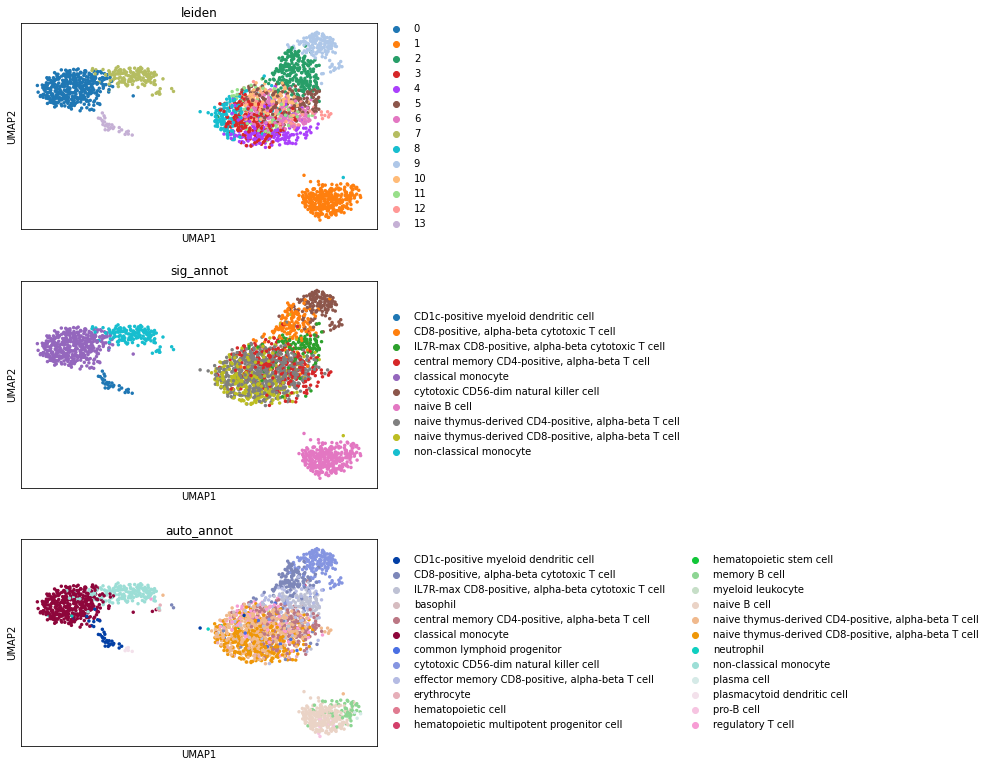

In [5]:
sc.pl.umap(pbmc3K_prediction, color = ["leiden", "sig_annot", "auto_annot"], ncols = 1)

besca.tl.auto_annot.report(...) is deprecated( besca > 2.3); please use besca.tl.report(...)


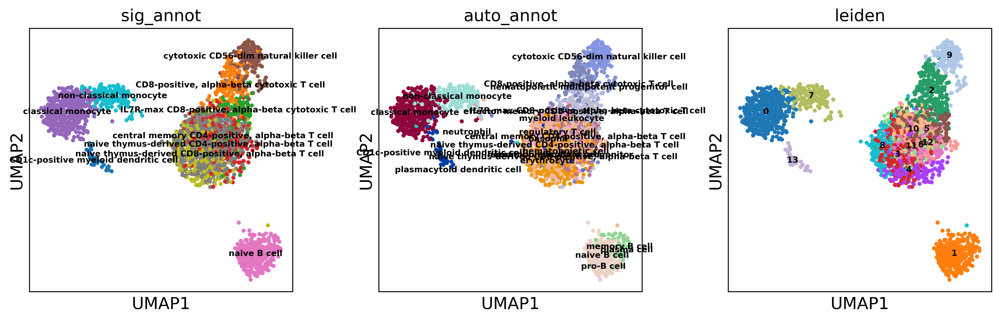

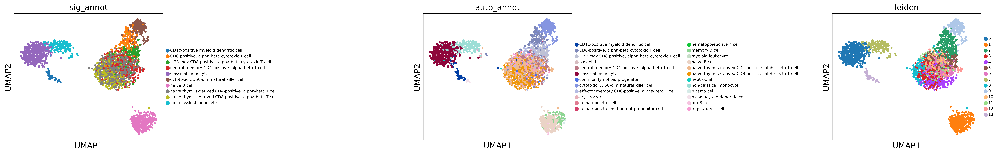

Confusion matrix, without normalization
Normalized confusion matrix


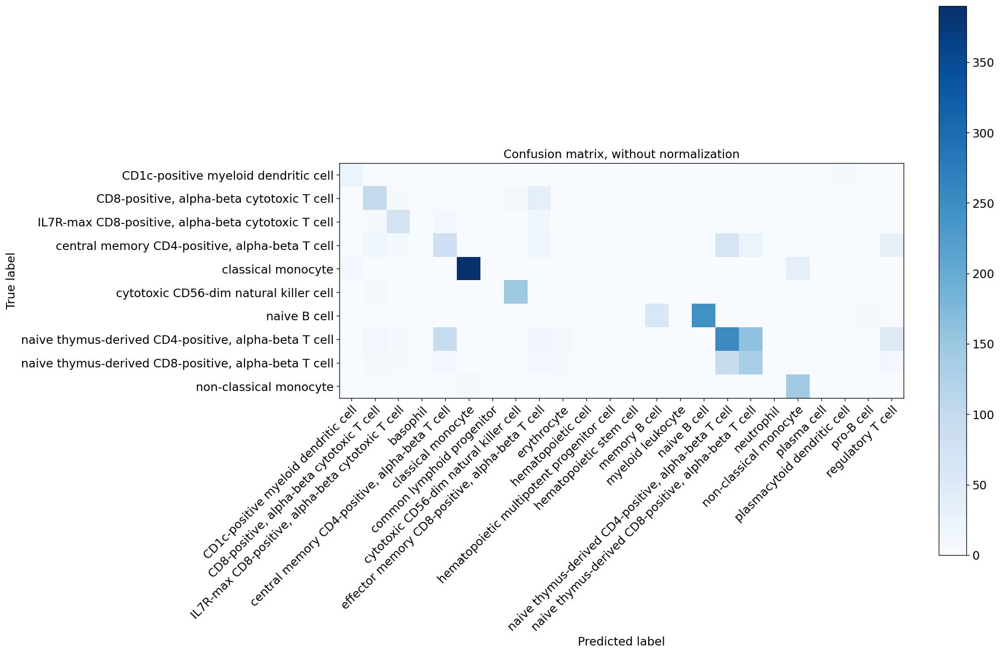

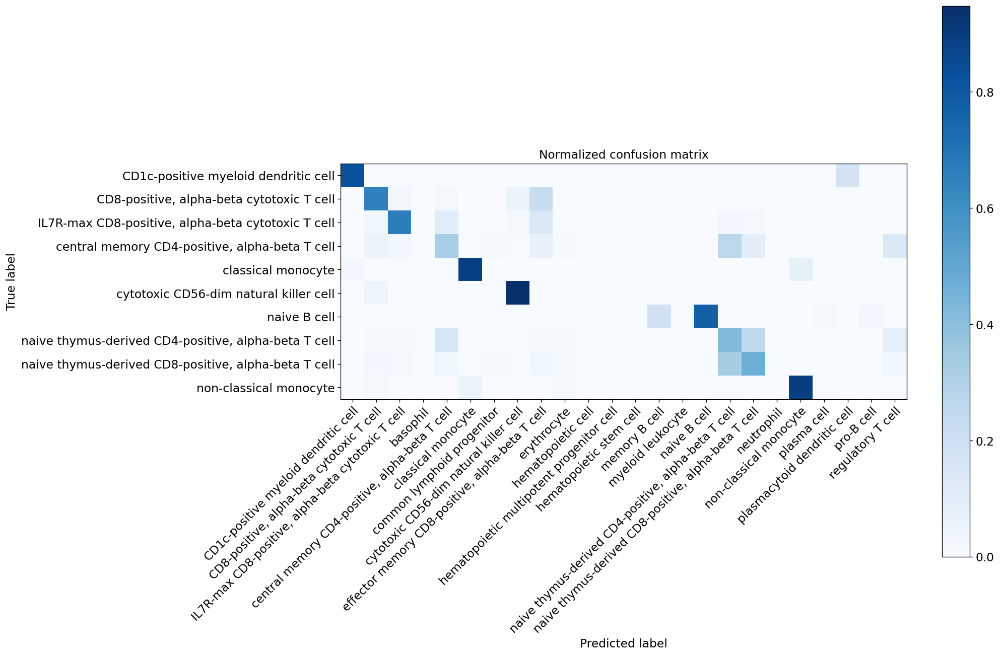

In [6]:
bc.tl.auto_annot.report(pbmc3K_prediction, celltype = 'sig_annot', method = 'autoannot', analysis_name= 'autoannot',
                       train_datasets='pmbc3k',  test_dataset='GranjaAndKV', merge = True, use_raw=False)

# SingleR prediction

We load the prediction obtained with SingleR and upload the said results in our h5ad object.

SingleR predictions were obtained in R, please see SingleR_K.html / SingleR_K.Rmd

In [7]:

read_Monaco_prediction= pd.read_csv("predictions/pred.pmbc3kwithMonaco.csv", index_col= 0)
read_Monaco_prediction.rename(columns={'labels': 'Monaco_label'},
                 inplace=True)
read_KV_prediction = pd.read_csv("predictions/predictedKV.csv", index_col= 0)
read_KV_prediction.rename(columns={'labels': 'KV_SingleR'},
                 inplace=True)

read_Granja_prediction = pd.read_csv("predictions/predictedGranja.csv", index_col= 0)
read_Granja_prediction.rename(columns={'labels': 'Granja_SingleR'},
                 inplace=True)

read_KV_Granja_prediction = pd.read_csv("predictions/combined_prediction.csv", index_col= 0)
read_KV_Granja_prediction.rename(columns={'labels': 'KVandGranja_SingleR'},
                 inplace=True)



## Labels to SingleR with Celldex packages


We need to map back the labels to SingleRs using the SingleR nomenclature (described in besca in CellTypes_v1.tsv) when using the singlecell datasets provided by SingleR (in the celldex package)

We do an exact mapping (if a subtype is not find, we go to large one). But we also do an exact mapping, ie. keeping as if celltype not supported now by besca

In [8]:
SingleR_Non_exactmapping = {'Central memory CD8 T cells': 'central memory CD8-positive, alpha-beta T cell',
      'Classical monocytes': 'classical monocytes', 
      'Effector memory CD8 T cells': 'effector memory CD8-positive, alpha-beta T cell', 
      'Exhausted B cells': 'exhausted B cell',
      'Follicular helper T cells': 'CD4-positive helper T cell',
      'Intermediate monocytes' : 'intermediate monocyte', # THIS IS NOT YET A SingleR BUT EFO IS CL:0002393
      'Low-density basophils' : 'mature basophil', # THIS IS NOT YET A SingleR BUT EFO annotated was :0000043
      'Low-density neutrophils' : 'mature neutrophil', # true mapping is 'mature neutrophil' , # THIS IS NOT YET A SingleR BUT EFO annotated was  CL:0000096
      'MAIT cells' : 'MAIT', 
      'Myeloid dendritic cells' :  'myeloid dendritic cell', 
      'Naive B cells' : 'naive B cell' , 
      'Naive CD4 T cells' : 'naive thymus-derived CD4-positive, alpha-beta T cell',
      'Naive CD8 T cells':  'naive thymus-derived CD8-positive, alpha-beta T cell', 
      'Natural killer cells' :  'cytotoxic CD56-dim natural killer cell',
      'Non classical monocytes': 'non-classical monocyte',
      'Non-switched memory B cells' : 'Non-switched memory B cells', # Non switched is a subgroup of memory Bcells CL:00000970) 
      'Plasmablasts' : 'Plasmablasts', # We do not have this subgroup either,http://purl.obolibrary.org/obo/CL_0000980
      'Plasmacytoid dendritic cells':'plasmacytoid dendritic cell',
      'Progenitor cells': 'Progenitor cells' ,
      'T regulatory cells' : 'regulatory T cell' , 
      'Terminal effector CD4 T cells' : 'effector CD4-positive, alpha-beta T cell',
      'Th1 cells': 'T-helper 1 cell'
                             }



SingleR_mapping = {'Central memory CD8 T cells': 'central memory CD8-positive, alpha-beta T cell',
      'Classical monocytes': 'classical monocytes', 
      'Effector memory CD8 T cells': 'effector memory CD8-positive, alpha-beta T cell', 
      'Exhausted B cells': 'exhausted B cell',
      'Follicular helper T cells': 'CD4-positive helper T cell',
      'Intermediate monocytes' : 'intermediate monocyte', # THIS IS NOT YET A SingleR BUT EFO IS CL:0002393
      'Low-density basophils' : 'basophil', # 'mature basophil', # THIS IS NOT YET A SingleR BUT EFO annotated was :0000043
      'Low-density neutrophils' : 'neutrophil', # true mapping is 'mature neutrophil' , # THIS IS NOT YET A SingleR BUT EFO annotated was  CL:0000096
      'MAIT cells' : 'MAIT', 
      'Myeloid dendritic cells' :  'myeloid dendritic cell', 
      'Naive B cells' : 'naive B cell' , 
      'Naive CD4 T cells' : 'naive thymus-derived CD4-positive, alpha-beta T cell',
       'Naive CD8 T cells':  'naive thymus-derived CD8-positive, alpha-beta T cell', 
      'Natural killer cells' :  'cytotoxic CD56-dim natural killer cell',
      'Non classical monocytes': 'non-classical monocyte',
       'Non-switched memory B cells' : 'memory B cell', # Non switched is a subgroup of memory Bcells CL:00000970) 
          'Plasmablasts' : 'B cell', # We do not have this subgroup either,http://purl.obolibrary.org/obo/CL_0000980
       'Plasmacytoid dendritic cells':'plasmacytoid dendritic cell',
      'Progenitor cells': 'hematopoietic multipotent progenitor cell' ,
       'T regulatory cells' : 'regulatory T cell' , 
      'Terminal effector CD4 T cells' : 'effector CD4-positive, alpha-beta T cell',
      'Th1 cells': 'T-helper 1 cell'}


In [9]:

read_Monaco_prediction['Monaco_SingleR'] = read_Monaco_prediction.Monaco_label.copy().map(SingleR_mapping)

read_Monaco_prediction['label_monaco'] = read_Monaco_prediction.Monaco_label.copy().map(SingleR_Non_exactmapping)

For datasets that were annotated with Besca (ie. Granja and Kotliarov), labels are consistents already, and comparisons is straight forward.

In [10]:
obs_bis = pbmc3K_prediction.obs.join(read_KV_prediction["KV_SingleR"], how = "left")
obs_bis = obs_bis.join(read_Granja_prediction["Granja_SingleR"], how = "left")
obs_bis = obs_bis.join(read_KV_Granja_prediction["KVandGranja_SingleR"], how = "left")

obs_bis = obs_bis.join(read_Monaco_prediction["Monaco_label"], how = "left") # REMEMBER THIS IOS BEFORE MAPPING SingleR
obs_bis = obs_bis.join(read_Monaco_prediction["label_monaco"], how = "left")
obs_bis = obs_bis.join(read_Monaco_prediction["Monaco_SingleR"], how = "left")

In [11]:
pbmc3K_prediction.obs  = obs_bis.copy()

... storing 'KV_SingleR' as categorical
... storing 'Granja_SingleR' as categorical
... storing 'KVandGranja_SingleR' as categorical
... storing 'Monaco_label' as categorical
... storing 'label_monaco' as categorical
... storing 'Monaco_SingleR' as categorical


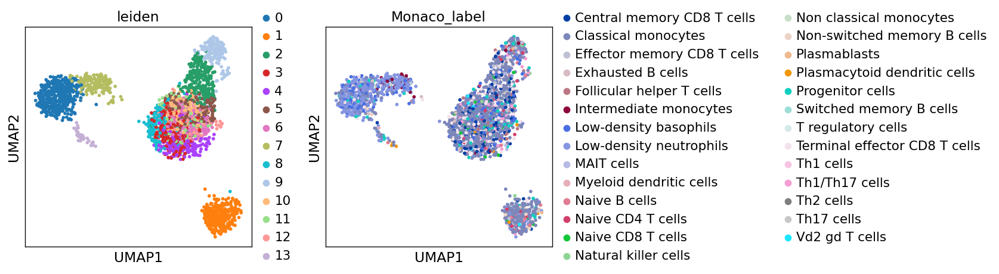

In [12]:

sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'Monaco_label'], ncols= 2)

In [13]:
#sc.pl.umap( pbmc3K_prediction, color = [ 'SingleR', "auto_annot", "KV_SingleR","Granja_SingleR","KVandGranja_SingleR" ], ncols= 2)

# Comparing predictions
We fix the palette to keep the same colors for the UMAPs celltypes

In [14]:
values_ = set( pd.Categorical(pbmc3K_prediction.obs.sig_annot).categories.tolist()+\
                  pd.Categorical(pbmc3K_prediction.obs.KV_SingleR).categories.tolist()+\
                  pd.Categorical(pbmc3K_prediction.obs.Granja_SingleR).categories.tolist()+\
                  pd.Categorical(pbmc3K_prediction.obs.KVandGranja_SingleR).categories.tolist()+\
                  pd.Categorical(pbmc3K_prediction.obs.Monaco_SingleR).categories.tolist()+\
                  pd.Categorical(pbmc3K_prediction.obs.label_monaco).categories.tolist()+\
                  pd.Categorical(pbmc3K_prediction.obs.auto_annot).categories.tolist())
import seaborn as sns 
palette_ = sns.color_palette("tab10", len( values_) )
palette_colors  = dict(zip(values_, palette_))
#palette_colors

In [15]:
bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'dblabel', checkColors = True)
bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'auto_annot', checkColors = True)
bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'KV_SingleR', checkColors = True)
bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'Granja_SingleR', checkColors = True)
bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'KVandGranja_SingleR', checkColors = True)
#bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'label_monaco', checkColors = True)
bc.pl.update_qualitative_palette( pbmc3K_prediction, palette_colors,  group = 'Monaco_SingleR', checkColors = True)


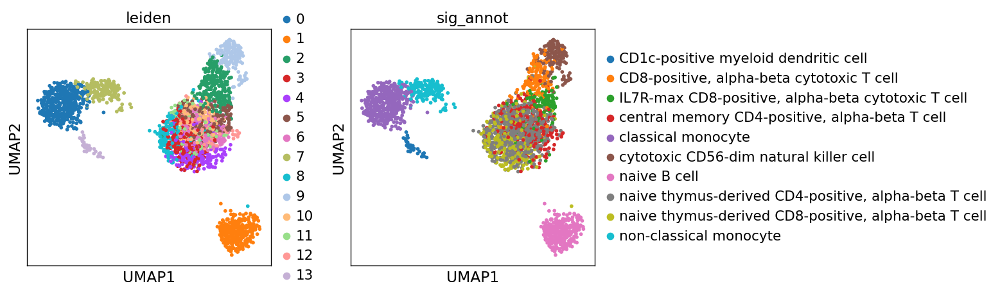

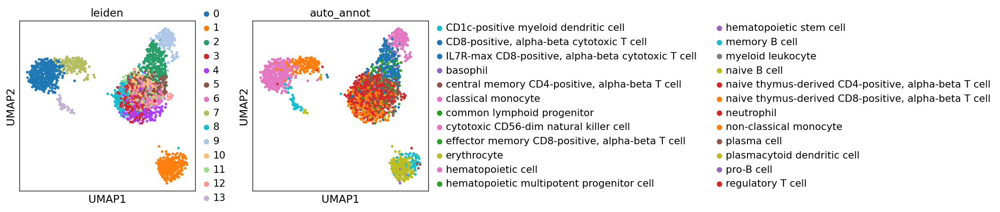

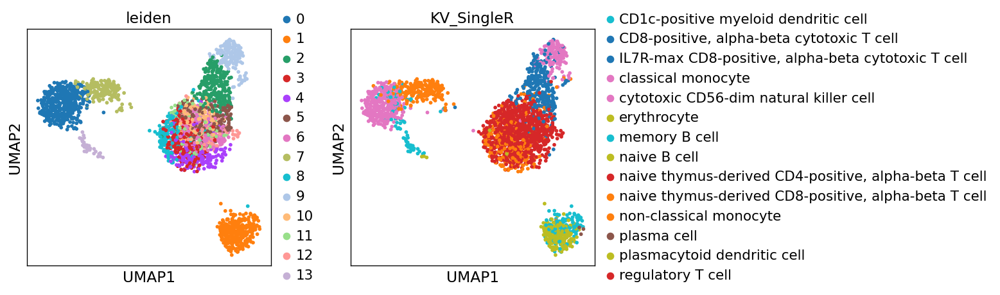

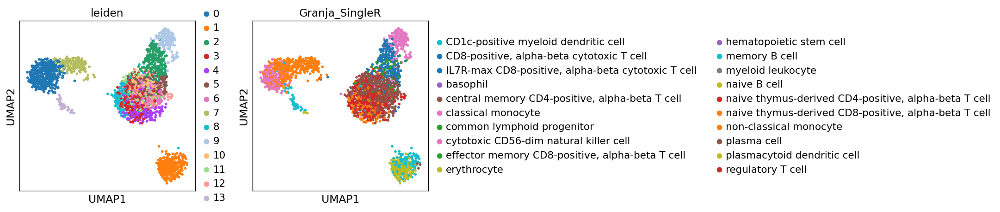

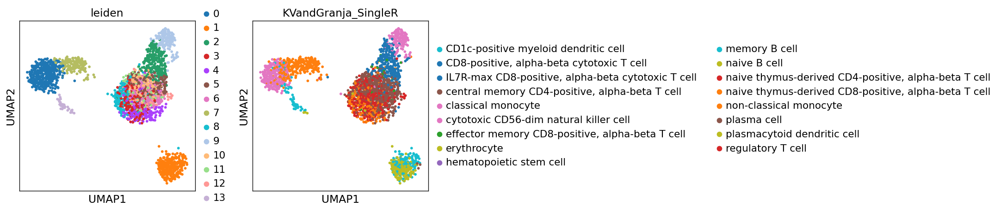

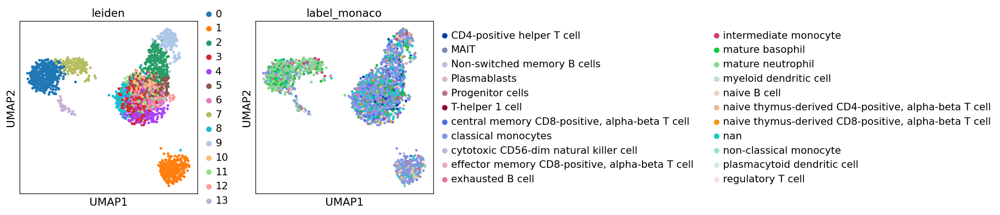

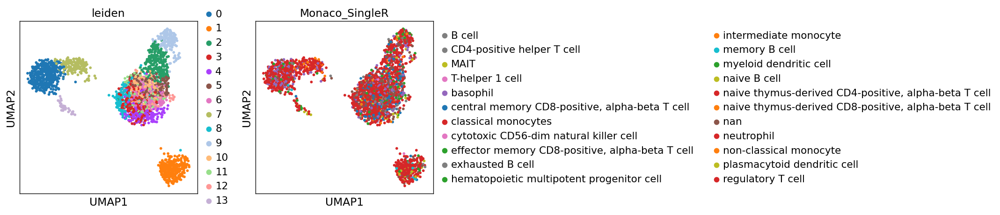

In [16]:
sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'sig_annot'], ncols= 2)
sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'auto_annot'], ncols= 2)
sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'KV_SingleR'], ncols= 2)
sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'Granja_SingleR'], ncols= 2)
sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'KVandGranja_SingleR'], ncols= 2)

sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'label_monaco'], ncols= 2)

sc.pl.umap( pbmc3K_prediction, color = ["leiden",  'Monaco_SingleR'], ncols= 2)


# Predictions reports generation 

In [17]:
#annot_comparison in adata_pred.obs_keys()

In [18]:
adata_pred = pbmc3K_prediction
method = "singleR"
merge = False
remove_nonshared  = True
use_raw = True
genes_to_use = ""
clustering = "leiden"
asymmetric_matrix= True

## AutoAnnot vs Sig-annot

Confusion matrix, without normalization
Normalized confusion matrix


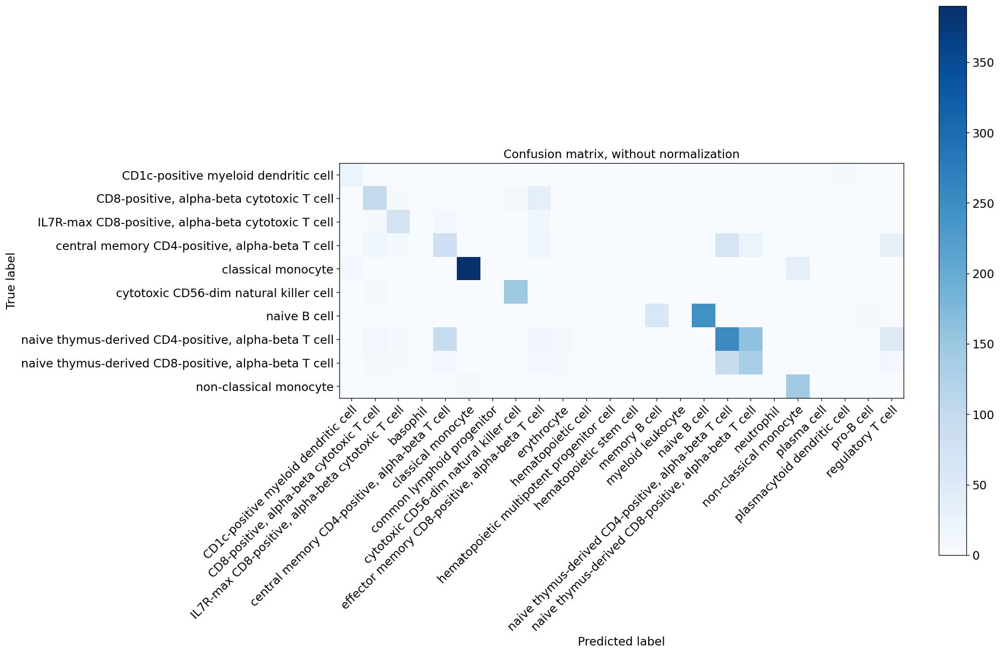

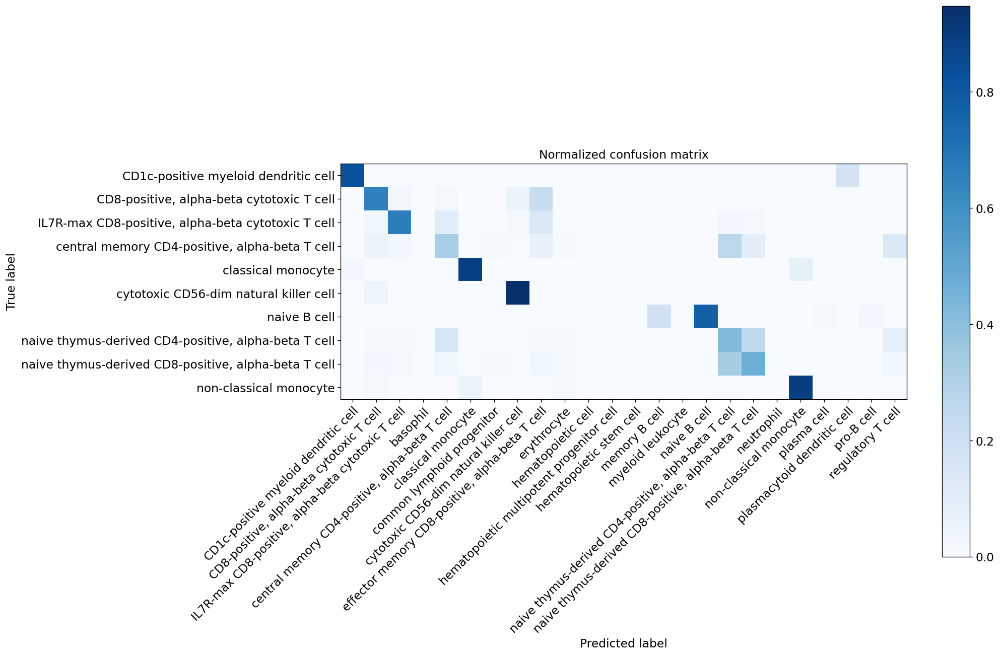

In [19]:

fig = bc.tl.report(adata_pred, 
                   celltype =  "sig_annot", method = "auto_annot", 
                   analysis_name =  "GranjaKV_",
             train_datasets= "GranjaKotliarov", test_dataset= "pbmc3k", name_report= "sigannot_vs_autoannot",
             merge = merge, name_prediction = 'auto_annot', 
             use_raw = use_raw,  genes_to_use = genes_to_use,
             remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

#fig.show()
#fig.show()

# Monaco

Confusion matrix, without normalization
Normalized confusion matrix


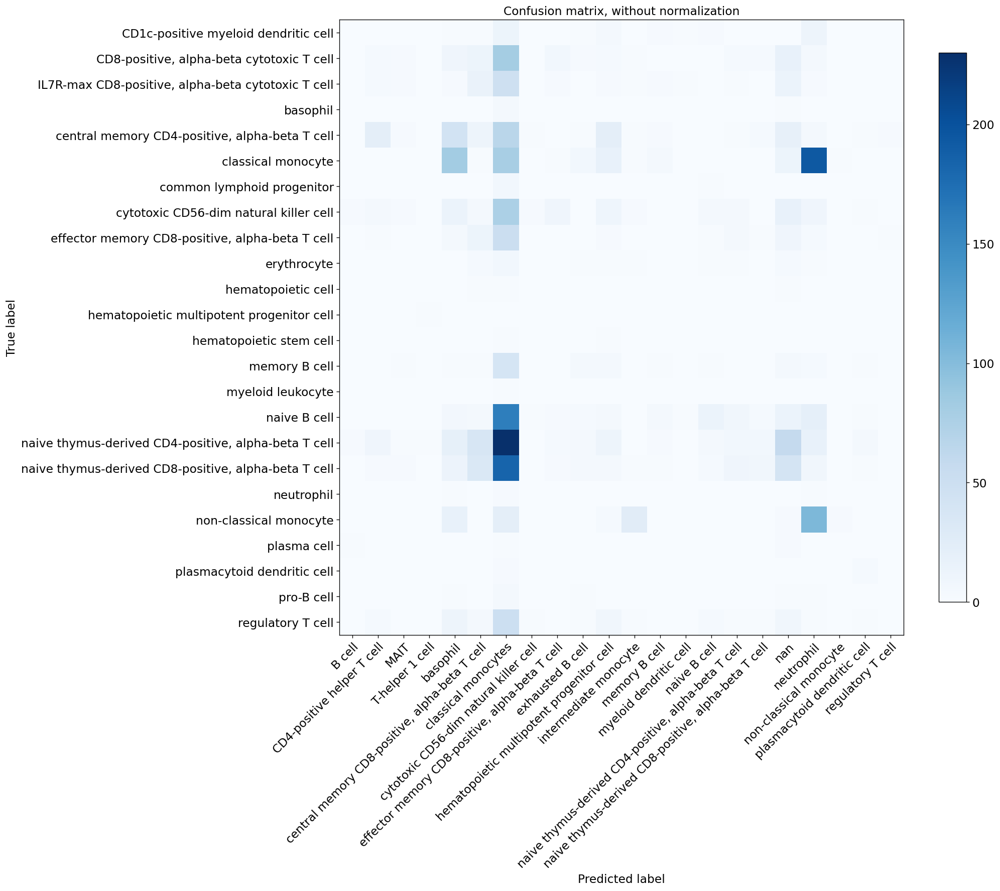

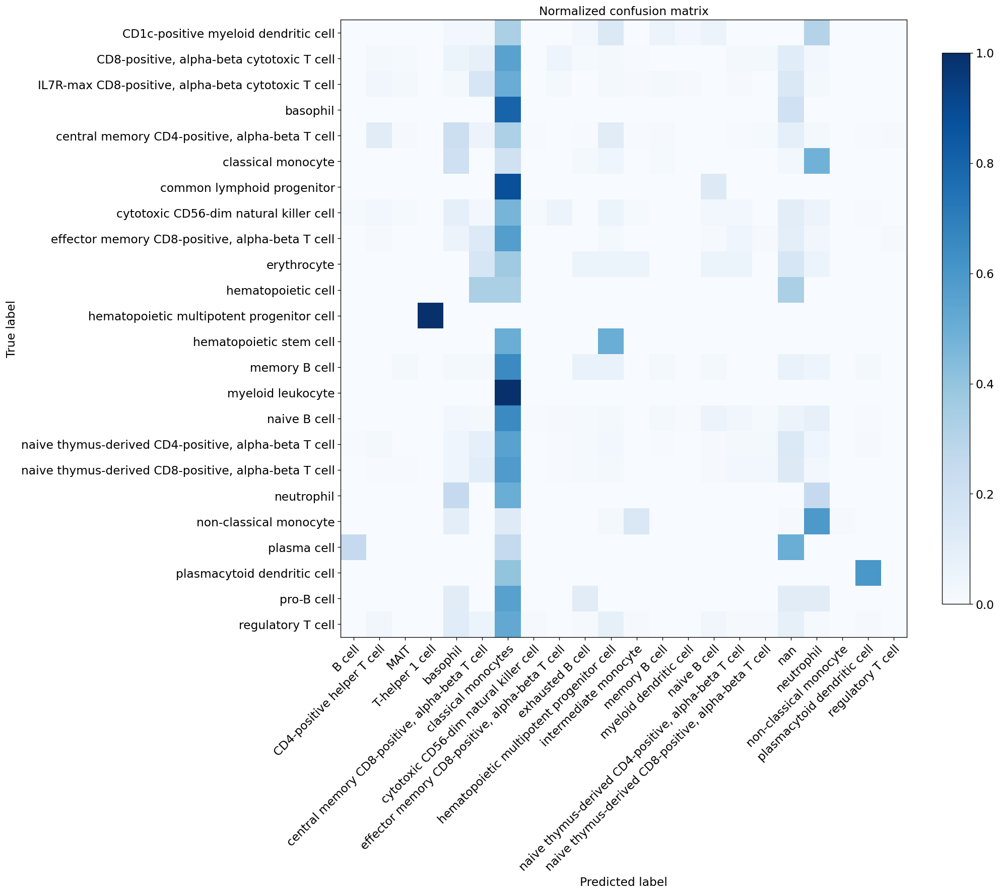

In [20]:

fig = bc.tl.report(adata_pred, celltype =  "auto_annot", method = "SingleR",
                   analysis_name =  "PMBCwithMonaco",
                 train_datasets= "Monaco", test_dataset= "pbmc3k",  name_report='SingleR_vs_AutoAnnot',
                 merge = merge, name_prediction = 'Monaco_SingleR', 
                 use_raw = use_raw,  genes_to_use = genes_to_use,
                 remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

Confusion matrix, without normalization
Normalized confusion matrix


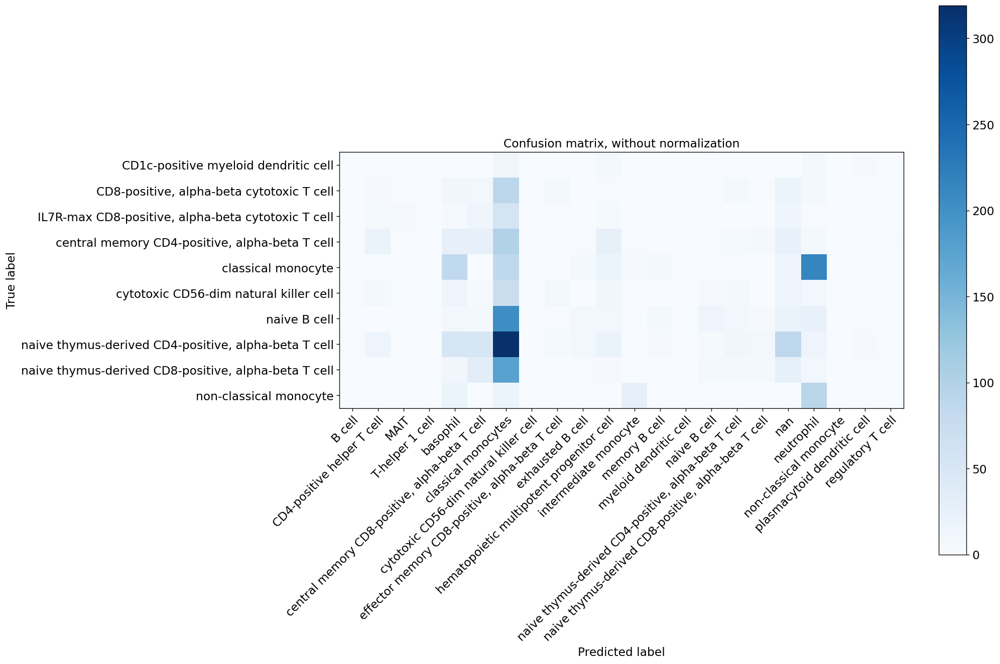

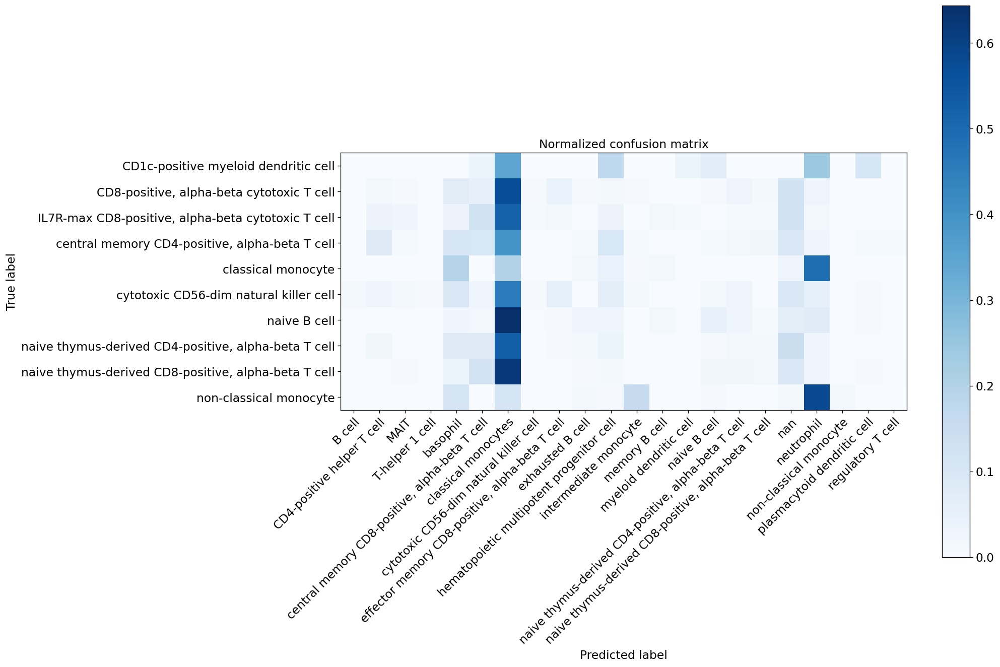

In [21]:

fig = bc.tl.report(adata_pred, 
                   celltype =  "sig_annot", method = "SingleR", 
                   analysis_name =  "PMBCwithMonaco",
             train_datasets= "Monaco", test_dataset= "pbmc3k", name_report= "SingleR_vs_Sigannot",
             merge = merge, name_prediction = 'Monaco_SingleR', 
             use_raw = use_raw,  genes_to_use = genes_to_use,
             remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)


## Granja

Confusion matrix, without normalization
Normalized confusion matrix


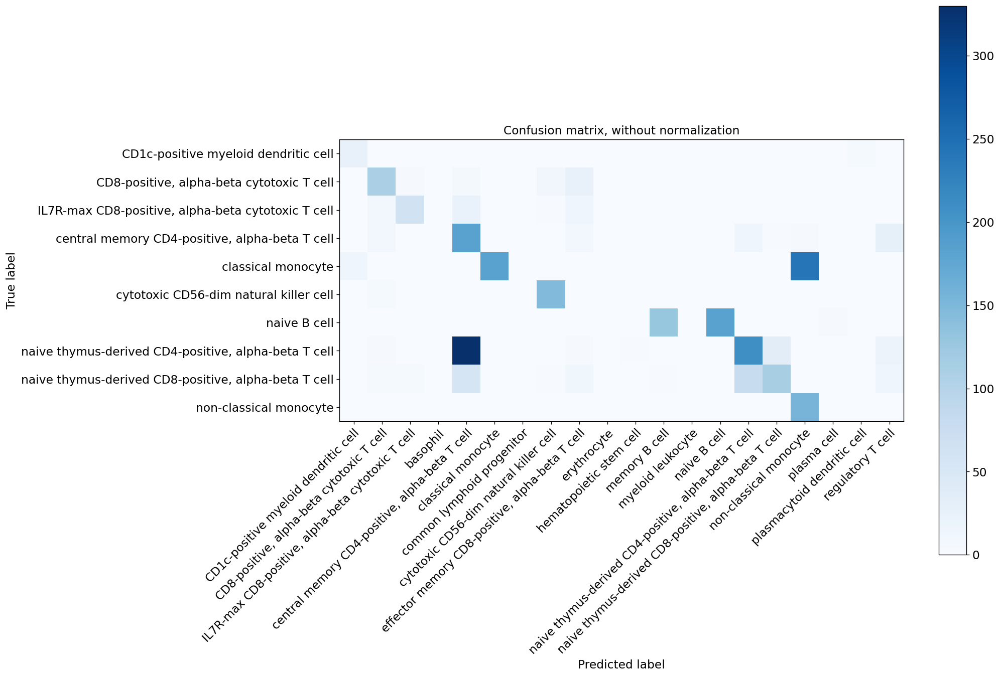

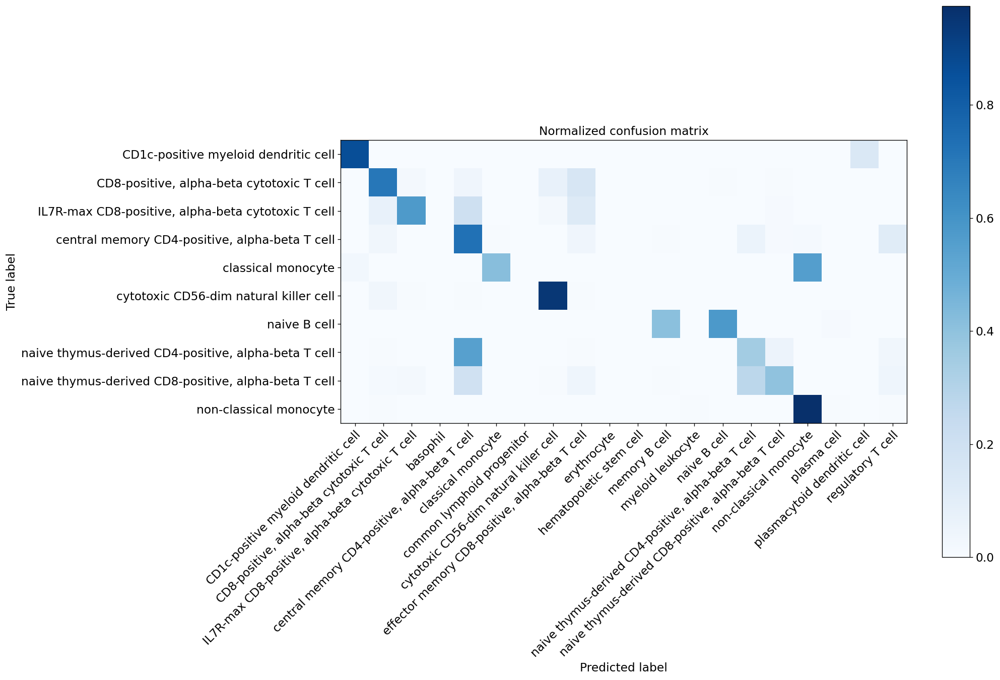

In [22]:

fig = bc.tl.report(adata_pred, celltype =  "sig_annot", method = "SingleR",
                   analysis_name =  "GranjaPred_SingleR", name_report='SingleR_vs_Sigannot',
             train_datasets= "Granja", test_dataset= "pbmc3k",
             merge = merge, name_prediction = 'Granja_SingleR', 
             use_raw = use_raw,  genes_to_use = genes_to_use,
             remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

#fig.show()

Confusion matrix, without normalization
Normalized confusion matrix


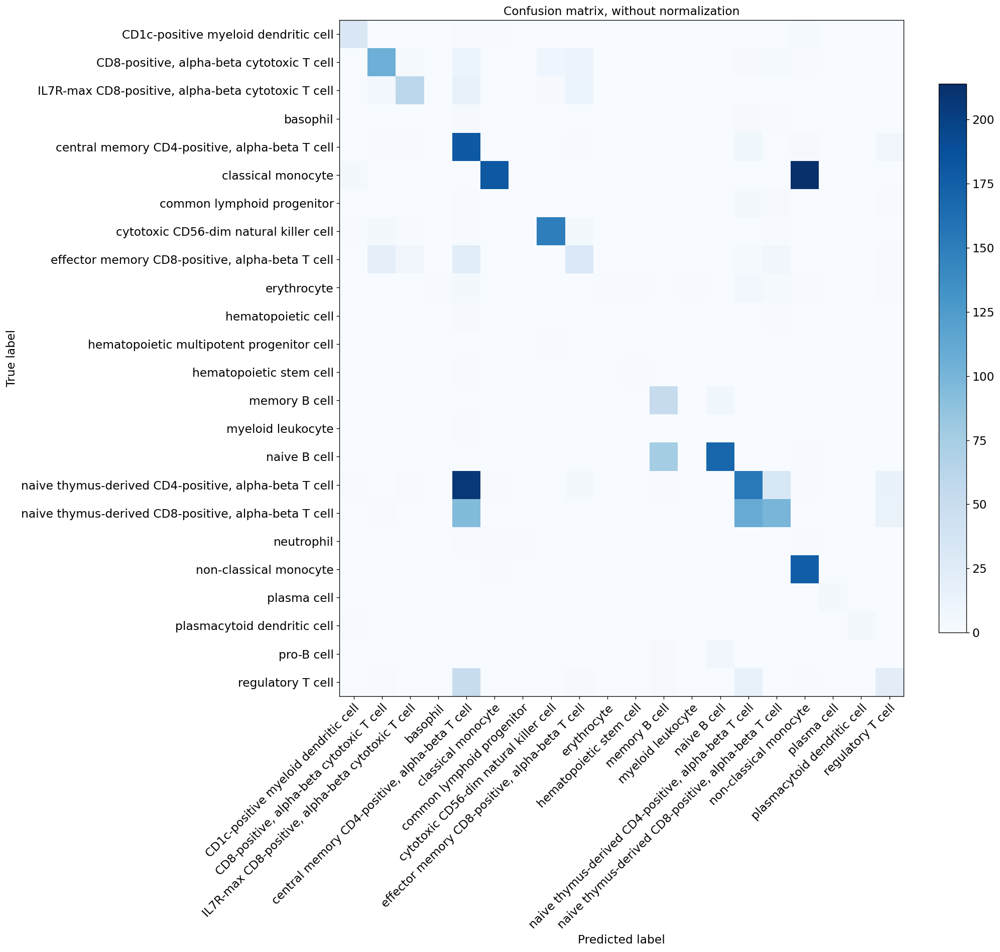

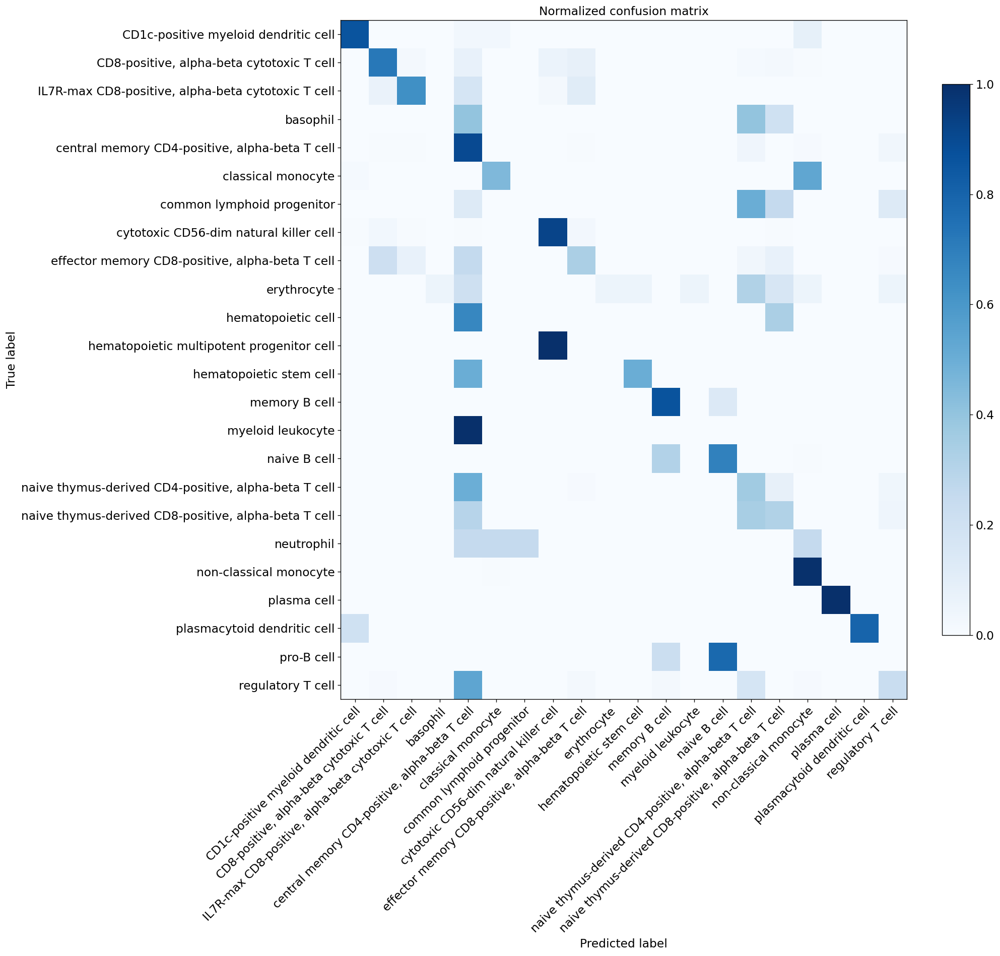

In [23]:

fig = bc.tl.report(adata_pred, celltype =  "auto_annot", method = "SingleR",
                   analysis_name =  "GranjaPred_SingleR",
                 train_datasets= "Granja", test_dataset= "pbmc3k",  name_report='SingleR_vs_AutoAnnot',
                 merge = merge, name_prediction = 'Granja_SingleR', 
                 use_raw = use_raw,  genes_to_use = genes_to_use,
                 remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

## Kotliarov

Confusion matrix, without normalization
Normalized confusion matrix


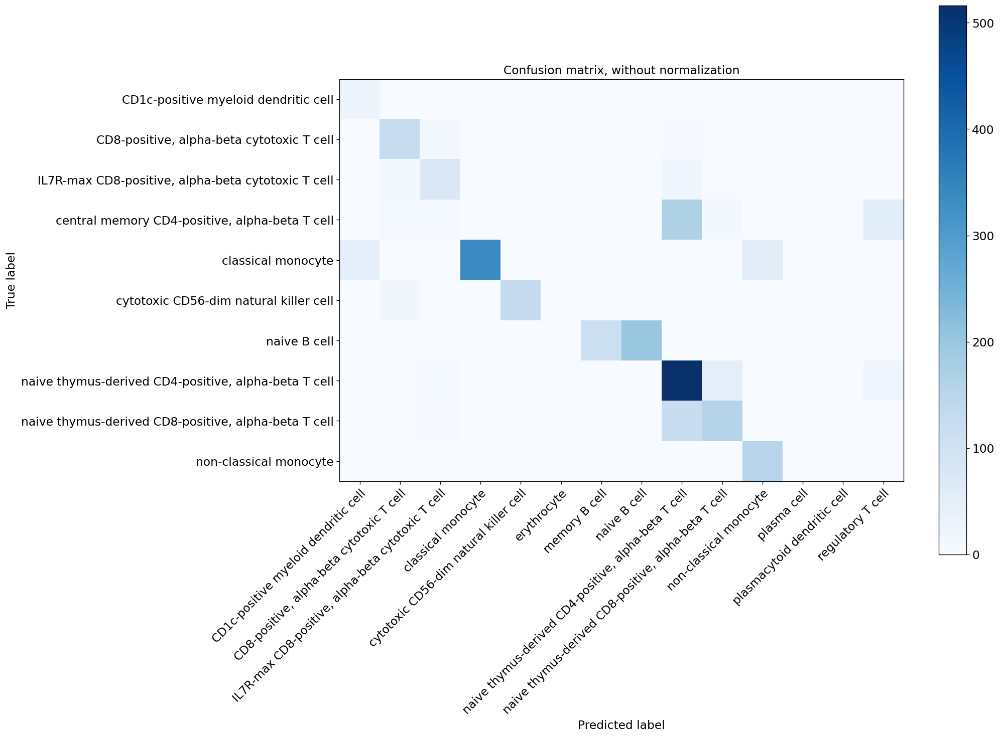

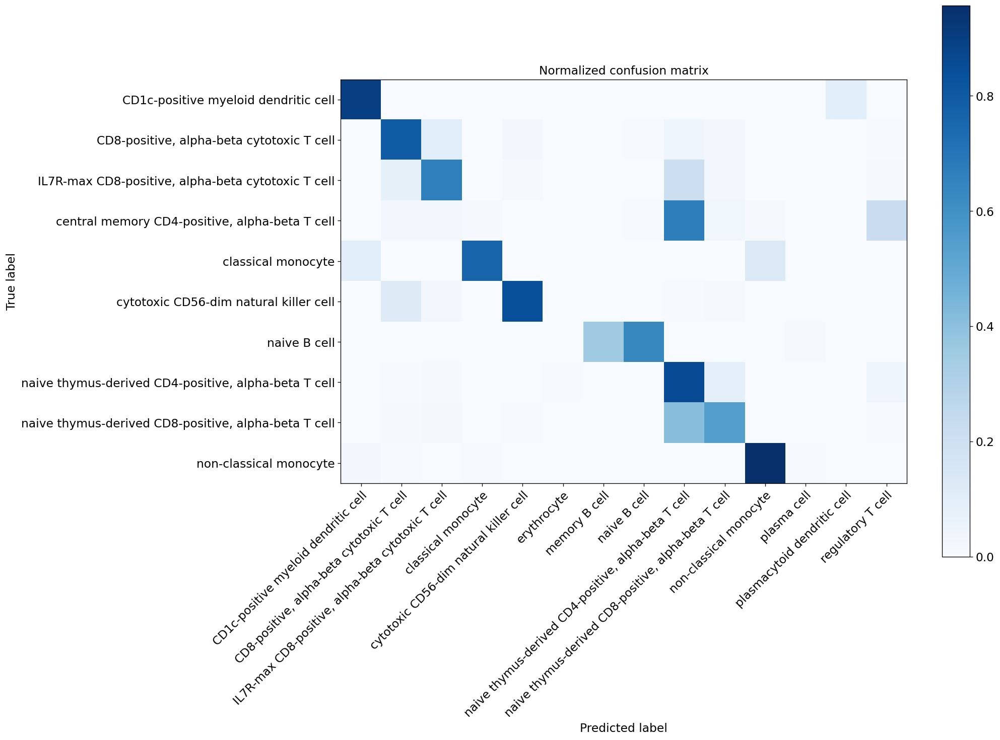

In [24]:

fig = bc.tl.report(adata_pred, celltype =  "sig_annot", method = "SingleR", 
                   analysis_name =  "KotliarovPred_SingleR",name_report='SingleR_vs_Sigannot',
             train_datasets= "Kotliarov", test_dataset= "pbmc3k",
             merge = merge, name_prediction = 'KV_SingleR', 
             use_raw = use_raw,  genes_to_use = genes_to_use,
             remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

#fig.show()

Confusion matrix, without normalization
Normalized confusion matrix


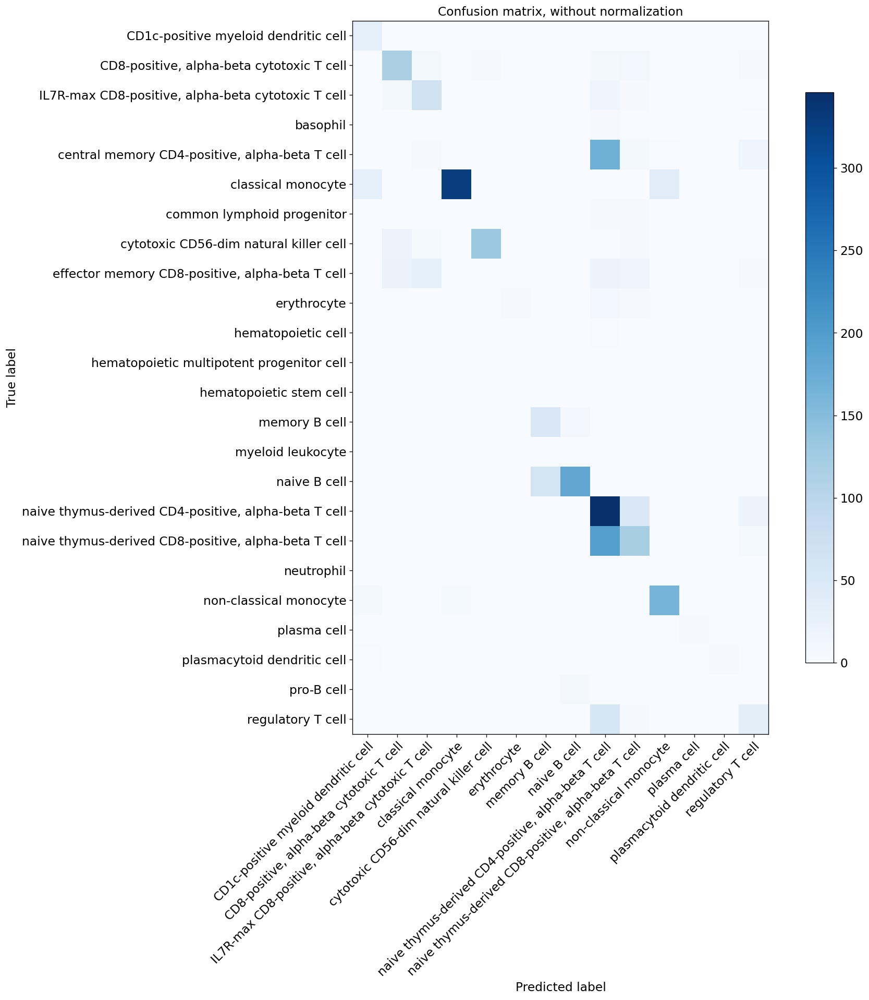

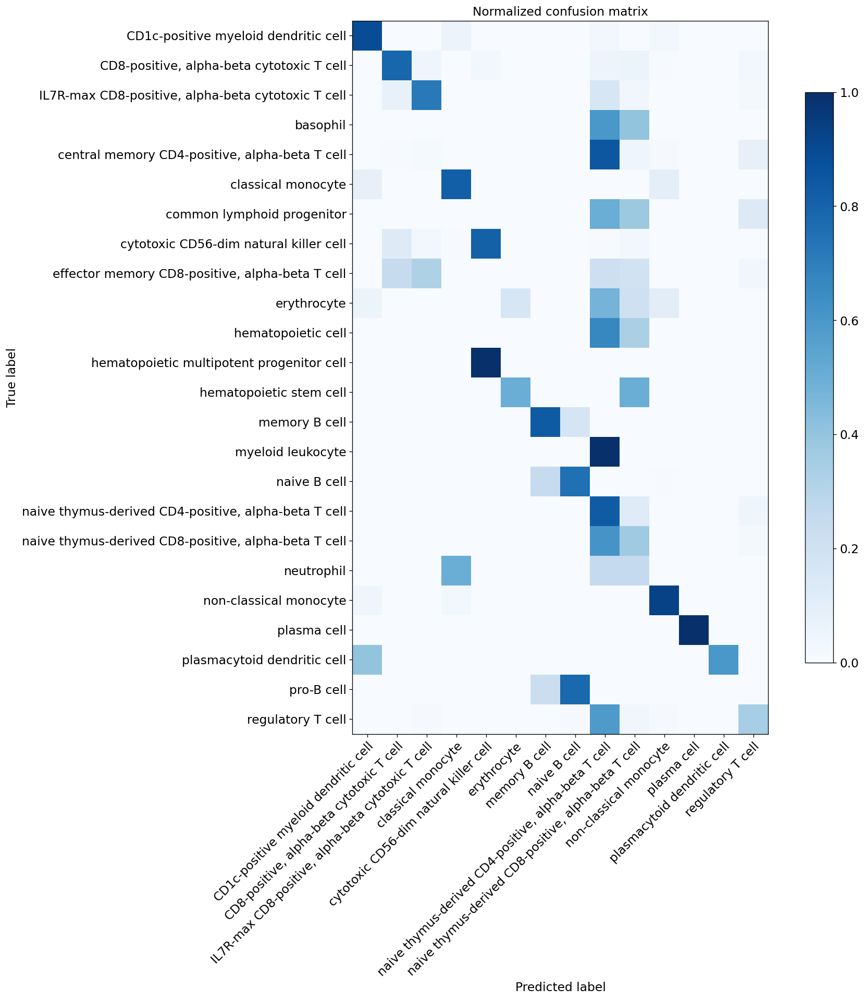

In [25]:

fig = bc.tl.report(adata_pred, celltype =  "auto_annot", method = "SingleR",
                   analysis_name =  "KotliarovPred_SingleR",
                 train_datasets= "Kotliarov", test_dataset= "pbmc3k",  name_report='SingleR_vs_AutoAnnot',
                 merge = merge, name_prediction = 'KV_SingleR', 
                 use_raw = use_raw,  genes_to_use = genes_to_use,
                 remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

## Granja + Kotliarov combined


Confusion matrix, without normalization
Normalized confusion matrix


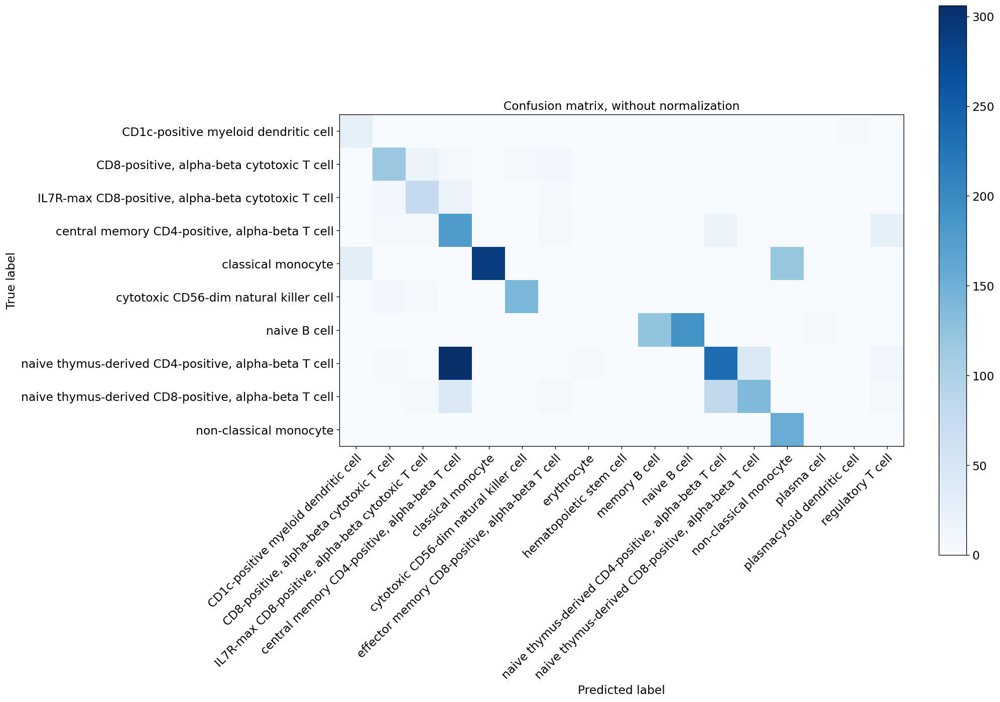

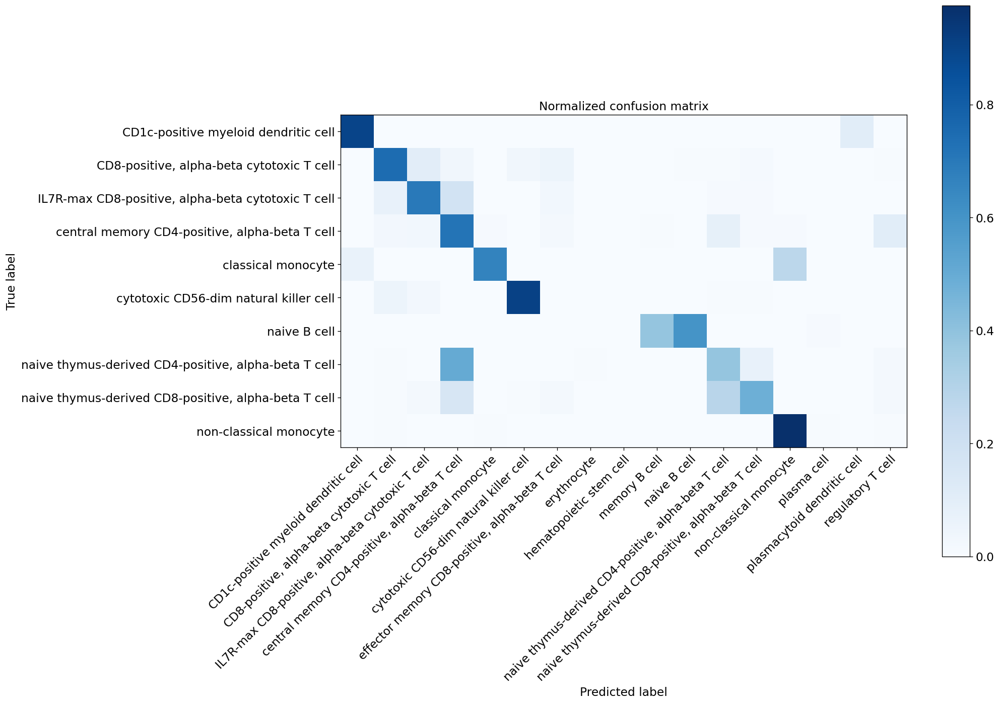

In [26]:

fig = bc.tl.report(adata_pred, celltype =  "sig_annot", method = "SingleR", 
                   analysis_name =  "KVandGranja_SingleR",
             train_datasets= "Granja", test_dataset= "pbmc3k",
             merge = merge, name_prediction = 'KVandGranja_SingleR', name_report='SingleR_vs_Sigannot',
             use_raw = use_raw,  genes_to_use = genes_to_use,
             remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

fig.show()

Confusion matrix, without normalization
Normalized confusion matrix


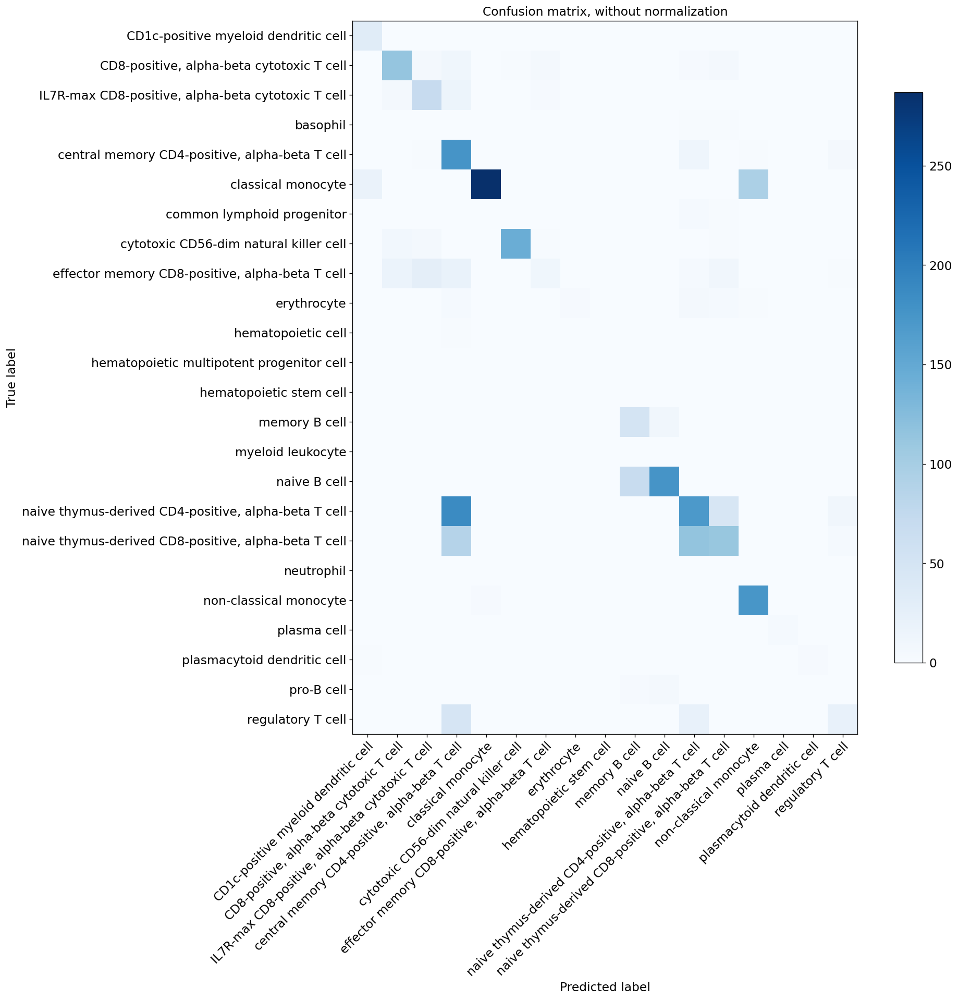

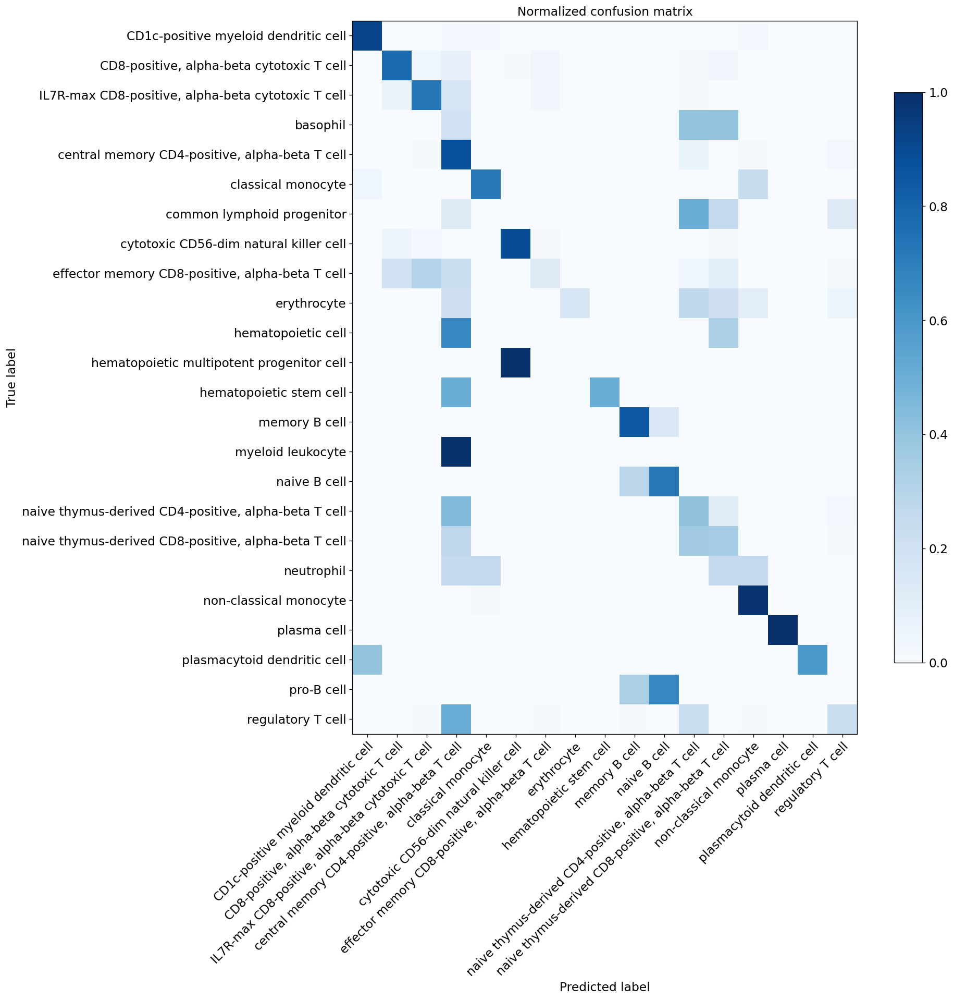

In [27]:

fig = bc.tl.report(adata_pred, celltype =  "auto_annot", method = "SingleR", analysis_name =  "KVandGranja_autoAnnot",
             train_datasets= "Granja", test_dataset= "pbmc3k",  name_report='SingleR_vs_AutoAnnot',
             merge = merge, name_prediction = 'KVandGranja_SingleR', 
             use_raw = use_raw,  genes_to_use = genes_to_use,
             remove_nonshared = False, clustering =clustering, asymmetric_matrix = True)

#fig.show()

# Compare F1 Score 

Besca report generate overall models.
We retrieved the overall F1 and accuracy score for all reports generated in order to compare those values.



In [28]:
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(".") if isfile(join(".", f)) and '_report_' in f]


In [29]:
f1_values  = pd.DataFrame(columns=['accuracy', 'f1' ] , index=onlyfiles)

In [30]:

for report in onlyfiles :
    get_info = open(report, "r").readlines()[3]
    dd = get_info.split(',')
    f1_values.loc[report] =[dd[1], dd[3].rstrip('\n')]
f1_values

,accuracy,f1
SingleR_vs_AutoAnnot_report_PMBCwithMonaco.csv,0.015175718849840255,0.02523369016041676
SingleR_vs_Sigannot_report_KVandGranja_SingleR.csv,0.6170127795527156,0.6524373659158926
SingleR_vs_AutoAnnot_report_KVandGranja_autoAnnot.csv,0.6182108626198083,0.6131802108581512
SingleR_vs_Sigannot_report_KotliarovPred_SingleR.csv,0.6833067092651757,0.6812172368998783
sigannot_vs_autoannot_report_GranjaKV_.csv,0.6357827476038339,0.6723363167601062
SingleR_vs_Sigannot_report_GranjaPred_SingleR.csv,0.5471246006389776,0.5864077675315164
auto_annot_report_autoannot.csv,0.6357827476038339,0.6723363167601062
SingleR_vs_Sigannot_report_PMBCwithMonaco.csv,0.013578274760383386,0.025063421714967452
SingleR_vs_AutoAnnot_report_GranjaPred_SingleR.csv,0.5666932907348243,0.5645149639742191
SingleR_vs_AutoAnnot_report_KotliarovPred_SingleR.csv,0.6313897763578274,0.596604303849193


We can see that prediction with Monaco datasets is problematic; which was visible in the UMAP and the generated reports (overall most cells were predicted as monocytes). One note here is due to installation issue, normalization of the data was done using Seurat not by Scuttle which was not available.

Overall, Single R compare with Auto-annot prediction are close (F1 = 0.613); auto-annot report is slightly closer to sig-annot prediction on pmbc3k (training with Granja+Kotliarov). (AutoAnnot F1 = 0.67; SingleR F1 = 0.65).


# Observing Cross-prediction 


Granja predicted with Kotliarov
Kotliarov predicted with Granja

In [31]:
Granja = bc.datasets.Granja2019_processed()
Kotliarov = bc.datasets.Kotliarov2020_processed()


In [32]:

read_Kotliarovprediction_TrainGranja= pd.read_csv("predictions/pred.KV_trainGranja.csv", index_col= 0)
read_Kotliarovprediction_TrainGranja.rename(columns={'labels': 'Granja_pred'},
                    inplace=True)



obs_bis = Kotliarov.obs.join(read_Kotliarovprediction_TrainGranja["Granja_pred"], how = "left")
Kotliarov.obs = obs_bis.copy()

In [33]:
read_GranjaPred_TrainKotliarov =  pd.read_csv("predictions/pred.Granja_trainKV.csv", index_col= 0)
read_GranjaPred_TrainKotliarov.rename(columns={'labels': 'KV_pred'},
                    inplace=True)

obs_bis = Granja.obs.join(read_GranjaPred_TrainKotliarov["KV_pred"], how = "left")
Granja.obs = obs_bis.copy()


... storing 'Granja_pred' as categorical


Confusion matrix, without normalization
Normalized confusion matrix


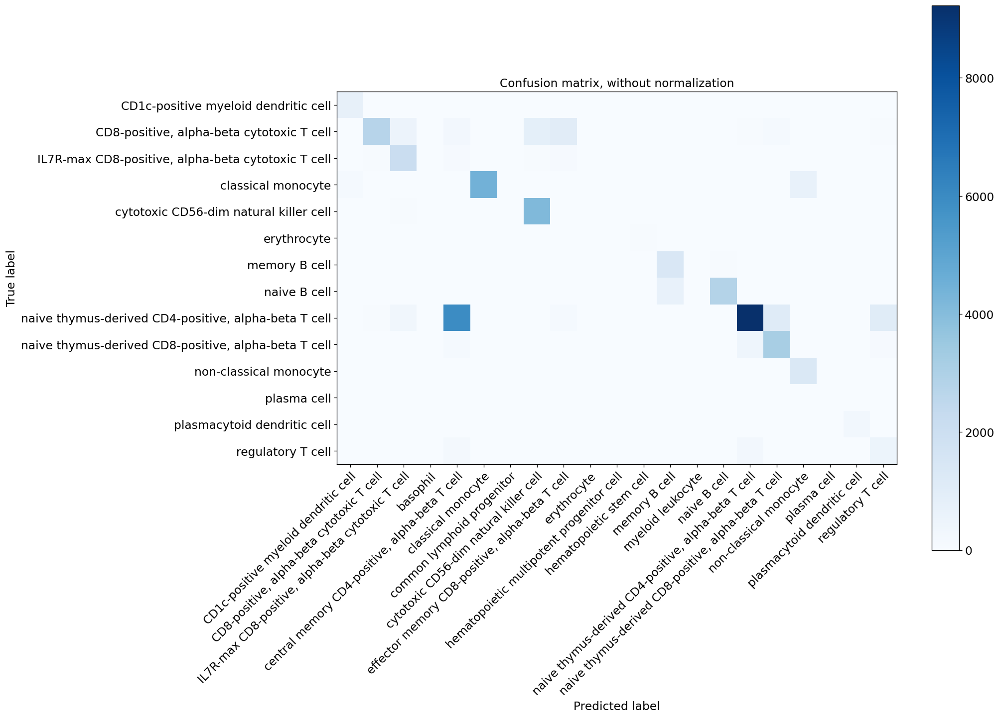

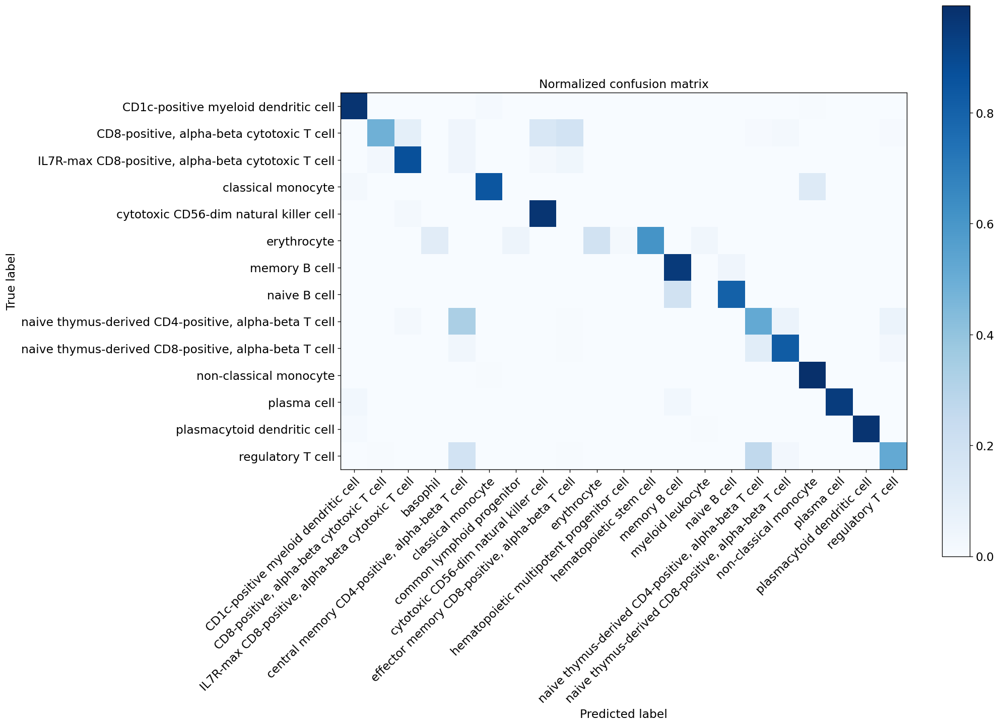

In [34]:
bc.tl.report(Kotliarov, 
                   celltype =  "celltype3", method = "SingleR", 
                   analysis_name =  "KotliarovTest_TrainedGranja",
             train_datasets= "Kotliarov", test_dataset= "Granja", name_report= "SingleR",
             merge = merge, name_prediction = 'Granja_pred', 
             use_raw = True,  genes_to_use = 'all',
             remove_nonshared = False, clustering = 'leiden', asymmetric_matrix = True)

... storing 'KV_pred' as categorical


Confusion matrix, without normalization
Normalized confusion matrix


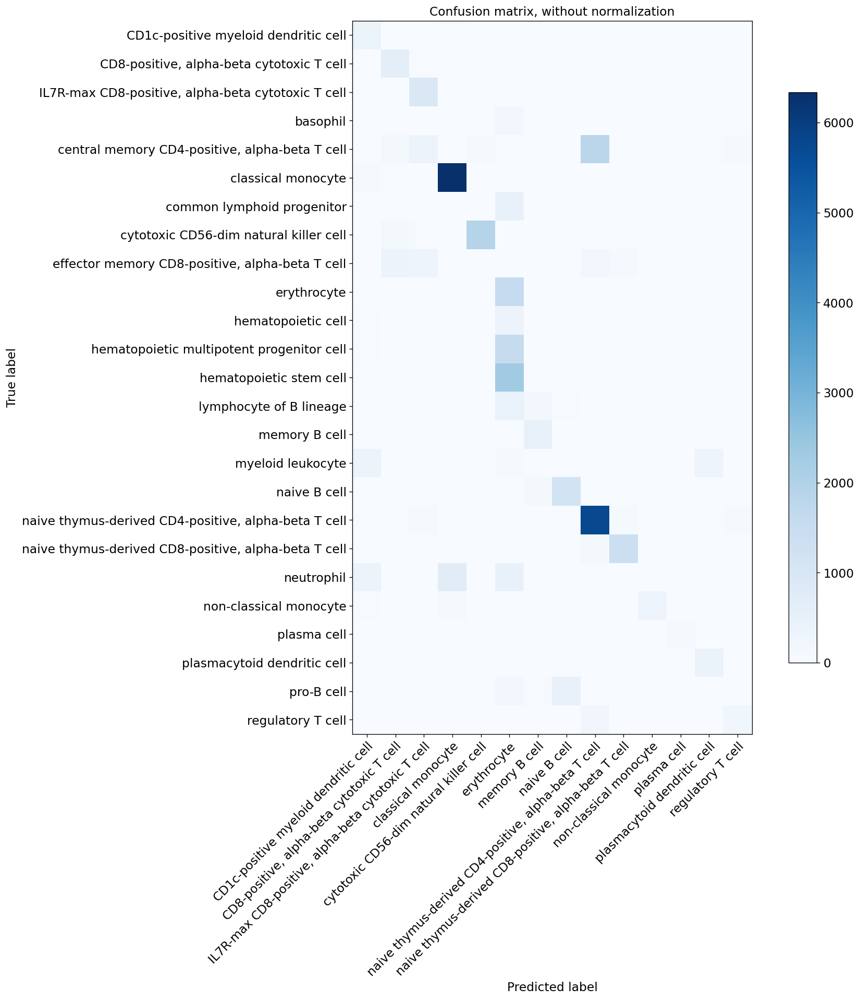

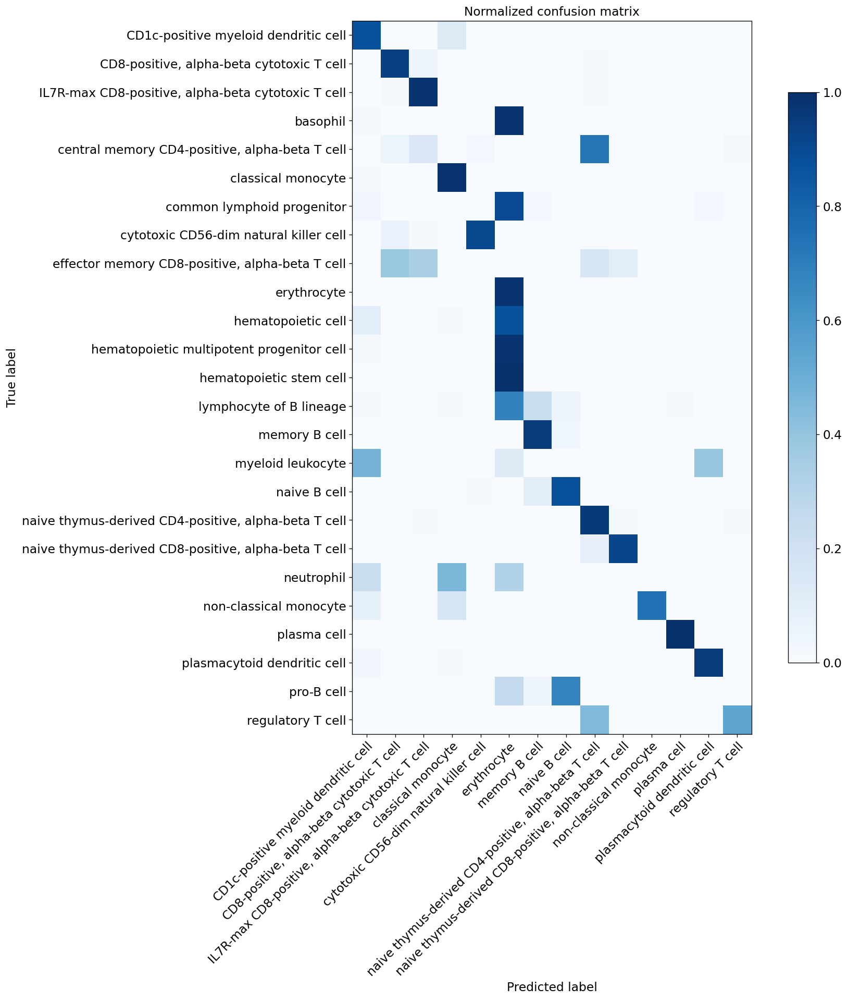

In [35]:
bc.tl.report(Granja, 
                   celltype =  "celltype3", method = "SingleR", 
                   analysis_name =  "GranjaTest_TrainedKotliarov",
             train_datasets= "Granja", test_dataset= "Kotliarov", name_report= "SingleR",
             merge = merge, name_prediction = 'KV_pred', 
             use_raw = True,  genes_to_use = 'all',
             remove_nonshared = False, clustering = 'leiden', asymmetric_matrix = True)

# END

In [40]:
! jupyter nbconvert --to html Single_R_comparison.ipynb

[NbConvertApp] Converting notebook Single_R_comparison.ipynb to html


In [39]:
from sinfo import sinfo
sinfo()

-----
anndata     0.7.4
besca       2.3+47.g155071e.dirty
pandas      1.1.5
plotly      4.11.0
scanpy      1.6.0
seaborn     0.11.0
sinfo       0.3.1
-----
IPython             7.12.0
jupyter_client      5.3.4
jupyter_core        4.6.1
notebook            6.1.5
-----
Python 3.7.9 | packaged by conda-forge | (default, Dec  9 2020, 21:08:20) [GCC 9.3.0]
Linux-3.10.0-693.11.6.el7.x86_64-x86_64-with-centos-7.4.1708-Core
24 logical CPU cores, x86_64
-----
Session information updated at 2021-01-11 16:05
